In [1]:
# 这个文件主要是用来尝试实现加入角度响应后的处理函数


数据类型： float64
数组形状： (472, 750)
数据范围： 0.0 ~ 5.0


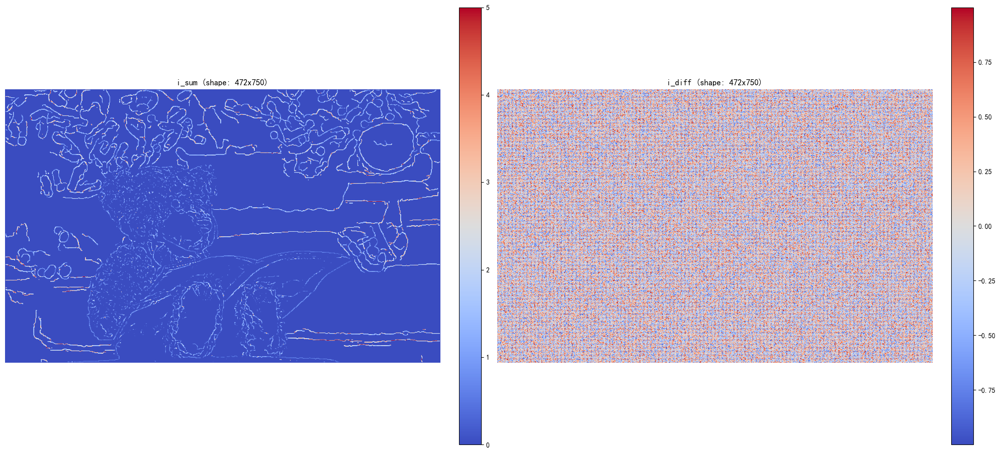

In [31]:
# angle_mask
# input: i_diff,i_sum
# output: angle_mask

import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = ['SimHei']  # 用来正常显示中文标签
plt.rcParams['axes.unicode_minus'] = False  # 用来正常显示负号

# 加载数据
i_sum = np.load('input0.png_sparse_bmap.npy')
h,w = i_sum.shape
i_diff = np.random.uniform(-1, 1, (h,w))
# 查看数据信息（可选）
print("数据类型：", i_sum.dtype)  # 查看数组的数据类型（如 uint8、float32 等）
print("数组形状：", i_sum.shape)  # 查看数组的维度（如 (H, W) 或 (H, W, C)）
print("数据范围：", i_sum.min(), "~", i_sum.max())  # 查看数值范围

# 子图1：显示数组的热图（冷色到暖色）
plt.figure(figsize=(20, 10))
plt.subplot(121)
im = plt.imshow(i_sum, cmap='coolwarm')  # 'coolwarm' 冷色（低值）到暖色（高值）
plt.title(f'i_sum (shape: {h}x{w})')
plt.axis('off')  # 隐藏坐标轴
plt.colorbar(im, fraction=0.046, pad=0.04)  # 添加颜色条

# 子图2：显示形状信息（可选，用文本标注）
plt.subplot(122)
im = plt.imshow(i_diff, cmap='coolwarm')  # 'coolwarm' 冷色（低值）到暖色（高值）
plt.title(f'i_diff (shape: {h}x{w})')
plt.axis('off')  # 隐藏坐标轴
plt.colorbar(im, fraction=0.046, pad=0.04)  # 添加颜色条

plt.tight_layout()  # 调整布局
plt.show()

def show_cool_warm_photo(data, cmap='coolwarm',title=None,threshold = None,if_show=False):
    '''
    : param data: 图片数据
    : param cmap: 颜色映射
    : param title: 图片标题
    : param range: 显示的数据范围
    '''
    if threshold is not None:
        data = np.where((data <= threshold[1]) & (data >= threshold[0]), data,0)  # 去除超过threshold的
    im = plt.imshow(data, cmap=cmap)
    if title is not None:
        plt.title(title)
    plt.axis('off')  # 隐藏坐标轴
    plt.colorbar(im,fraction=0.046, pad=0.04)  # 添加颜色条
    if if_show:
        plt.show()


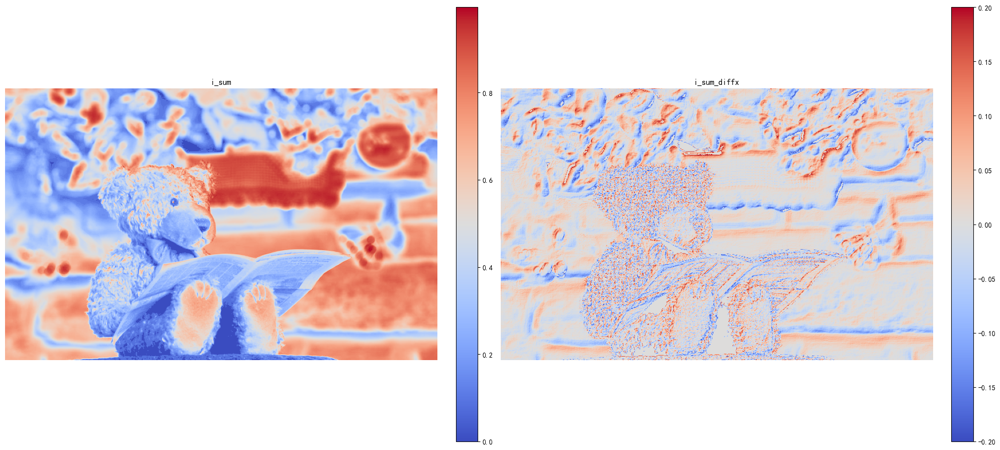

[-1. -0.  1.]


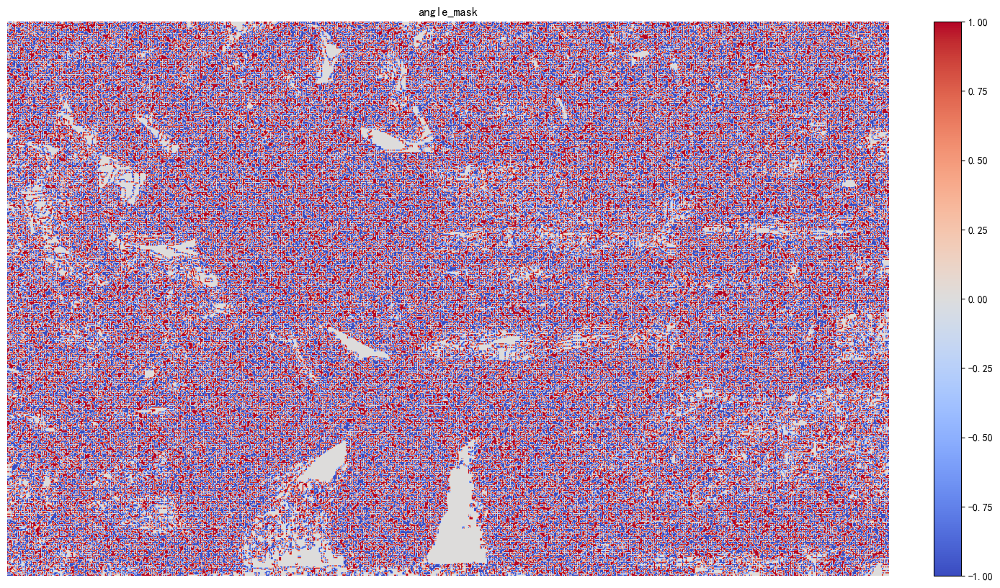

In [32]:
# 几种常见的差分算子
# 参考代码链接：https://blog.csdn.net/2401_83189603/article/details/149646314
import numpy as np
import matplotlib.pyplot as plt
import cv2
i_sum = cv2.imread("input0.png",cv2.IMREAD_GRAYSCALE)/255
h,w = i_sum.shape
i_diff = np.random.uniform(-1, 1, (h,w))


# 计算x方向差分
kernel=np.array([[-1,-1,0],
                 [-1,3,0],
                 [0,0,0]],dtype=np.float32)
# 二维卷积操作
i_sum_diffx=cv2.filter2D(i_sum,-1,kernel)

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
show_cool_warm_photo(i_sum,title = "i_sum")
plt.subplot(1,2,2)
show_cool_warm_photo(i_sum_diffx,title = "i_sum_diffx",threshold=(-0.2,0.2))
plt.tight_layout()  # 调整布局
plt.show()



# 计算angle_mask
# input: i_diff,i_sum,threshold
# output: angle_mask
threshold = 0.6
sign_diff = np.sign(i_diff)
sign_sum_x_diff = np.sign(i_sum_diffx)
angle_mask = sign_diff * sign_sum_x_diff
angle_mask = np.where(abs(sign_diff)>threshold,angle_mask,0)
print(np.unique(angle_mask))
plt.figure(figsize=(20,10))
show_cool_warm_photo(angle_mask,title = "angle_mask",threshold=(-2,2))
plt.show()



def generate_angle_mask(i_diff,i_sum,threshold = 0.1,kernel = None):
    '''
    :param i_diff: diff图像
    :param i_sum: 低通图
    :param threshold: 阈值
    :return: angle_mask 焦前焦后mask
    '''

    # 计算x方向差分
    if kernel is None:
        kernel=np.array([[-1,-1,0],
                        [-1,3,0],
                        [0,0,0]],dtype=np.float32)
    # 二维卷积操作
    i_sum_diffx=cv2.filter2D(i_sum,-1,kernel)
    sign_diff = np.sign(i_diff)
    sign_sum_x_diff = np.sign(i_sum_diffx)
    angle_mask = sign_diff * sign_sum_x_diff
    angle_mask = np.where(abs(sign_diff)>threshold,angle_mask,0)
    return angle_mask


# angle_mask = generate_angle_mask(i_diff,i_sum,threshold = 0.1)
# plt.figure(figsize=(20,10))
# show_cool_warm_photo(angle_mask,title = "angle_mask",threshold=(-2,2))
# plt.show()

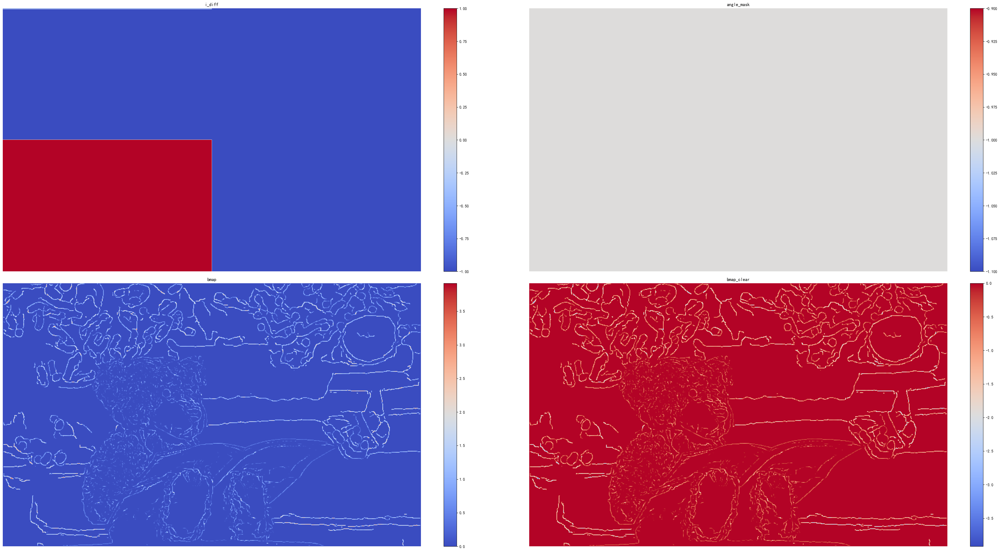

In [ ]:
# 基于angle_mask去除bmap的模糊性
import numpy as np
import matplotlib.pyplot as plt
import cv2
i_sum = cv2.imread("input0.png",cv2.IMREAD_GRAYSCALE)/255
h,w = i_sum.shape
i_diff = np.full((h,w),-1)
# 计算半高和半宽
half_h = h // 2
half_w = w // 2

# 左上角区域赋值为0
i_diff[1, :half_w] = 0

# 左下角区域赋值为1
i_diff[half_h:, :half_w] = 1


kernel=np.array([[-1,-1,0],
                 [-1,3,0],
                 [0,0,0]],dtype=np.float32)
angle_mask = generate_angle_mask(i_diff,i_sum,kernel =kernel)

bmap = np.load("input0.png_filtered_bmap.npy")

bmap_clear = bmap*angle_mask
plt.figure(figsize=(40,20))
plt.subplot(2,2,1)
show_cool_warm_photo(i_diff,title = "i_diff")
plt.subplot(2,2,2)
show_cool_warm_photo(angle_mask,title = "angle_mask")
plt.subplot(2,2,3)
show_cool_warm_photo(bmap,title = "bmap")
plt.subplot(2,2,4)
show_cool_warm_photo(bmap_clear,title = "bmap_clear")
plt.tight_layout()
plt.show()

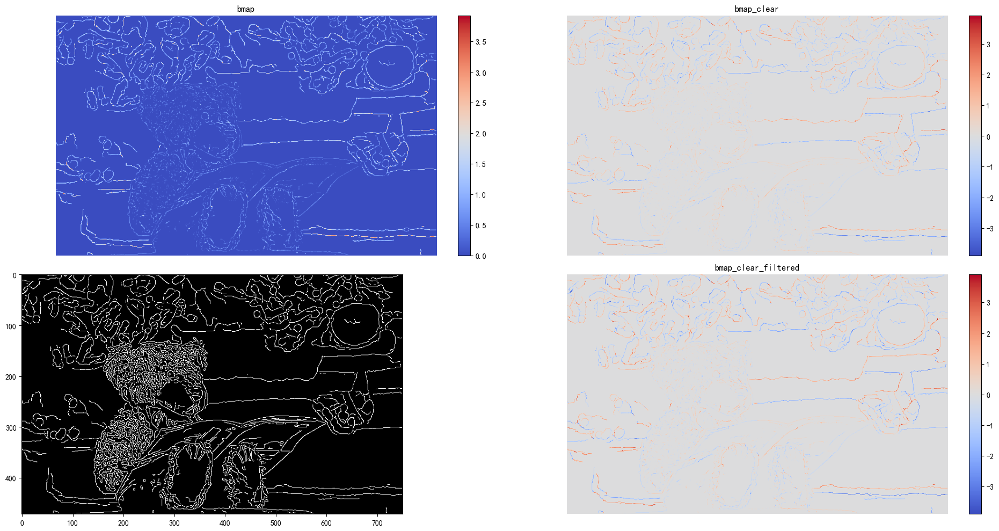

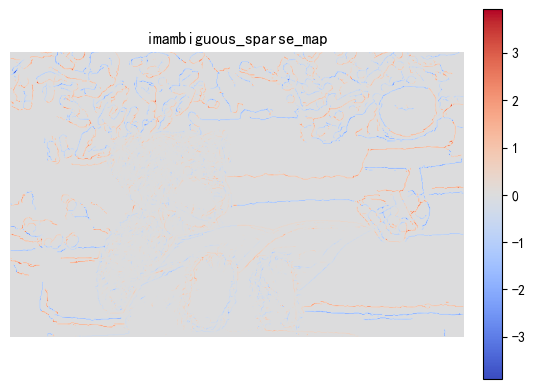

In [ ]:
# 边缘上的扩充（无值变为有值）（使用JBF滤波?）
import numpy as np
import matplotlib.pyplot as plt
import cv2
i_sum = cv2.imread("input0.png",cv2.IMREAD_GRAYSCALE)/255
h,w = i_sum.shape
i_diff = np.full((h,w),-1)
# 计算半高和半宽
half_h = h // 2
half_w = w // 2

# 某一行某部分赋值为0
i_diff[0, half_w:] = 0

# 左下角区域赋值为1
i_diff[half_h:, :half_w] = 1


kernel=np.array([[-1,-1,0],
                 [-1,3,0],
                 [0,0,0]],dtype=np.float32)
angle_mask = generate_angle_mask(i_diff,i_sum,kernel =kernel,threshold=0.1)


bmap = np.load("input0.png_filtered_bmap.npy")
h,w = bmap.shape
bmap_clear = bmap*angle_mask
# 赋值为0的值为邻近的最大值
edge_mask = np.load("input0.png_edge_map.npy")
bmap_clear_abs = np.abs(bmap_clear)
kernel=cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
bmap_clear_dilated = cv2.dilate(bmap_clear_abs,kernel=kernel)
sign_matrix = np.where(angle_mask>=0,1,-1)
bmap_clear_filtered = bmap_clear_dilated*sign_matrix*edge_mask

plt.figure(figsize=(20,10))
plt.subplot(2,2,1)
show_cool_warm_photo(bmap,title = "bmap")
plt.subplot(2,2,2)
show_cool_warm_photo(bmap_clear,title = "bmap_clear")
plt.subplot(2,2,3)
plt.imshow(edge_mask,cmap="gray")
plt.subplot(2,2,4)
show_cool_warm_photo(bmap_clear_filtered,title = "bmap_clear_filtered")
plt.tight_layout()
plt.show()


def generate_imambiguous_sparse_map(sparse_bmp,angle_mask,edge_mask):
    '''
    :param sparse_bmp: 稀疏边缘图
    :param angle_mask: 焦前焦后图
    :param edge_mask: 边缘图
    '''
    bmap_clear = sparse_bmp*angle_mask
    bmap_clear_abs = np.abs(bmap_clear)
    kernel= cv2.getStructuringElement(cv2.MORPH_RECT, (3,3)) # 八领域
    bmap_clear_dilated = cv2.dilate(bmap_clear_abs,kernel=kernel)
    sign_matrix = np.where(angle_mask>=0,1,-1)
    bmap_clear_filtered = bmap_clear_dilated*sign_matrix*edge_mask
    return bmap_clear_filtered

im = generate_imambiguous_sparse_map(bmap,angle_mask,edge_mask)
show_cool_warm_photo(im,title = "imambiguous_sparse_map",if_show=True)

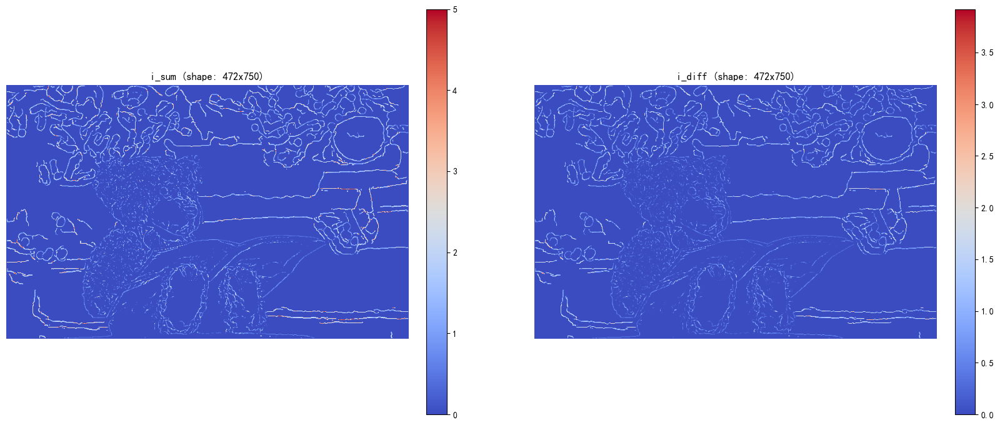

In [9]:
i_sum = np.load("input0.png_sparse_bmap.npy")
i_diff = np.load("input0.png_filtered_bmap.npy")
plt.figure(figsize=(20, 10))
plt.subplot(121)
im = plt.imshow(i_sum, cmap='coolwarm')  # 'coolwarm' 冷色（低值）到暖色（高值）
plt.title(f'i_sum (shape: {h}x{w})')
plt.axis('off')  # 隐藏坐标轴
plt.colorbar(im, fraction=0.046, pad=0.04)  # 添加颜色条

# 子图2：显示形状信息（可选，用文本标注）
plt.subplot(122)
im = plt.imshow(i_diff, cmap='coolwarm')  # 'coolwarm' 冷色（低值）到暖色（高值）
plt.title(f'i_diff (shape: {h}x{w})')
plt.axis('off')  # 隐藏坐标轴
plt.colorbar(im, fraction=0.046, pad=0.04)  # 添加颜色条